In [3]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
# Load the dataset
file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)
#Transpose the data to have observations as rows and features as columns
data = data.T
print("Dimensions:", data.shape)
print(data.head())
print(data.describe()) # Details of the data

# Perform k-means clustering on the original data
k = 4  # Because of Sillhoutte Score
kmeans = KMeans(n_clusters=k, random_state=42)
clusters_original = kmeans.fit_predict(data)

# Generate the n x n matrix M
n = data.shape[0]
M = np.zeros((n, n), dtype=int)
for i in range(n):
    for j in range(n):
        if clusters_original[i] == clusters_original[j]:
            M[i, j] = 1

# Perform PCA and keep the first three principal components
pca = PCA(n_components=3)
data_reduced = pca.fit_transform(data)

# Perform k-means clustering on the reduced-dimensional data
kmeans_reduced = KMeans(n_clusters=k, random_state=42)
clusters_reduced = kmeans_reduced.fit_predict(data_reduced)

# Generate the n x n matrix P
P = np.zeros((n, n), dtype=int)
for i in range(n):
    for j in range(n):
        if clusters_reduced[i] == clusters_reduced[j]:
            P[i, j] = 1

# Count the number of entries that are the same between M and P
same_entries = np.sum(M == P)
same_entries

Dimensions: (459, 2207)
       0         1     2         3     ...      2203      2204      2205      2206
0  0.048734  0.156177   0.0  0.504464  ...  0.068796  0.068681  0.101562  0.082707
1  0.111323  0.074072   0.0  0.571429  ...  0.194103  0.197802  0.117188  0.150376
2  0.064023  0.080148   0.0  0.473214  ...  0.181818  0.162088  0.195312  0.132832
3  0.058767  0.131366   0.0  0.410714  ...  0.031941  0.024725  0.109375  0.162907
4  0.050645  0.147004   0.0  0.446429  ...  0.140049  0.131868  0.148438  0.170426

[5 rows x 2207 columns]
             0           1      2     ...        2204        2205        2206
count  459.000000  459.000000  459.0  ...  459.000000  459.000000  459.000000
mean     0.080778    0.120589    0.0  ...    0.251107    0.204572    0.196368
std      0.077852    0.125591    0.0  ...    0.159509    0.157142    0.120650
min      0.000000    0.000000    0.0  ...    0.000000    0.000000    0.000000
25%      0.049212    0.050928    0.0  ...    0.127747    0.1015

194341

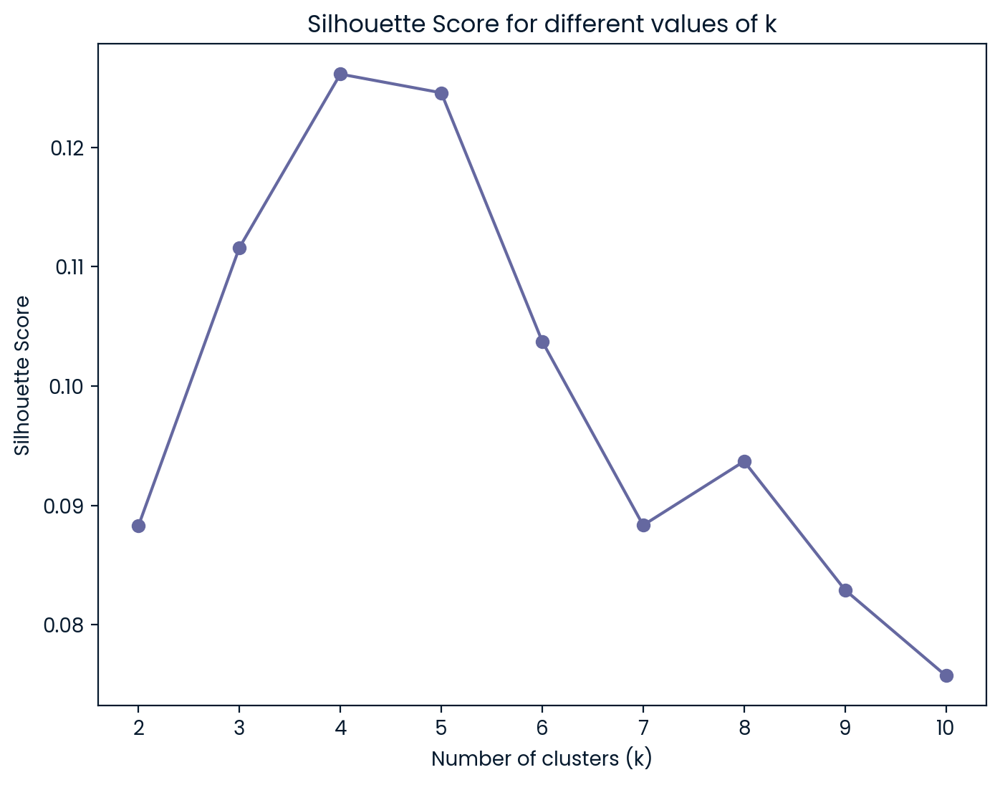

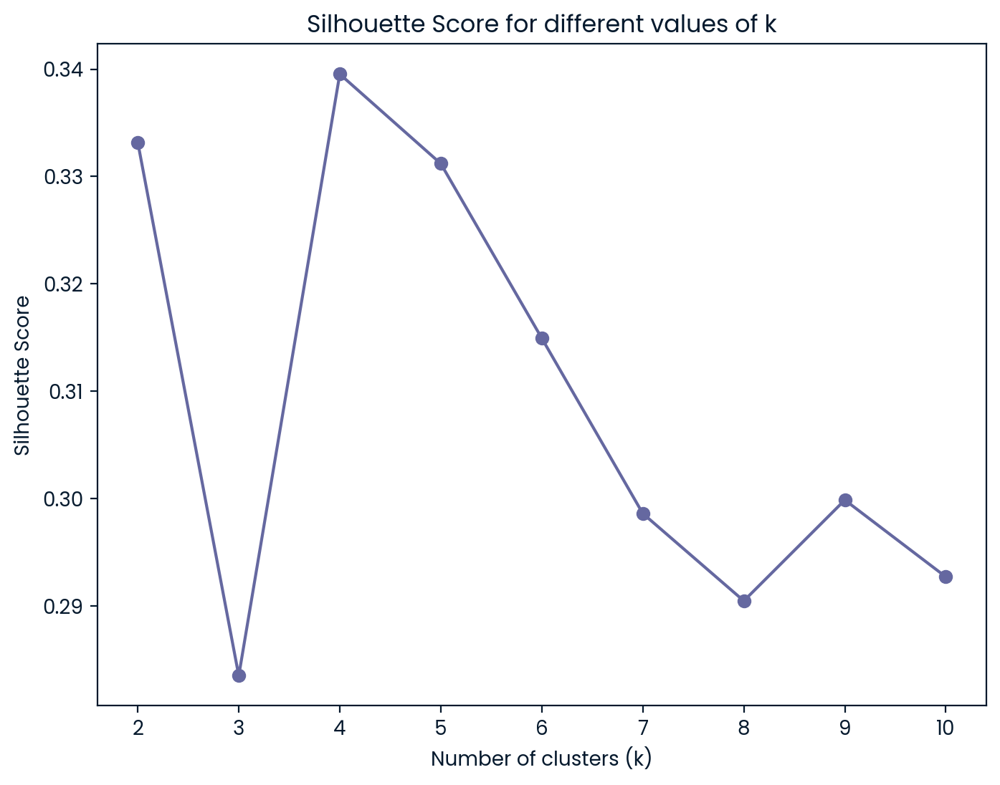

In [41]:
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

# Function to calculate the silhouette score for different values of k
def find_optimal_clusters(data, max_k):
    iters = range(2, max_k+1)
    s_scores = []
    
    for k in iters:
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(data)
        s_scores.append(silhouette_score(data, kmeans.labels_))
    
    plt.figure(figsize=(8, 6))
    plt.plot(iters, s_scores, marker='o')
    plt.xlabel('Number of clusters (k)')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Score for different values of k')
    plt.show()

# Find the optimal number of clusters for the original data
find_optimal_clusters(data, 10)

# Find the optimal number of clusters for the reduced-dimensional data
find_optimal_clusters(data_reduced, 10)

The silhouette score is a metric used to evaluate the quality of a clustering algorithm. It measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation). The silhouette score ranges from -1 to 1, where:

- A score close to 1 indicates that the object is well-matched to its own cluster and poorly matched to neighboring clusters.
- A score close to 0 indicates that the object is on or very close to the decision boundary between two neighboring clusters.
- A score close to -1 indicates that the object might have been assigned to the wrong cluster.

The silhouette score for a single sample is calculated using the following formula:

\[ s = \frac{b - a}{\max(a, b)} \]

where:
- \( a \) is the mean distance between the sample and all other points in the same cluster.
- \( b \) is the mean distance between the sample and all other points in the next nearest cluster.

The overall silhouette score for a dataset is the mean of the silhouette scores for all samples.

In the context of the provided code, the silhouette score is used to determine the optimal number of clusters (k) by plotting the silhouette scores for different values of k and identifying the value that maximizes the score.

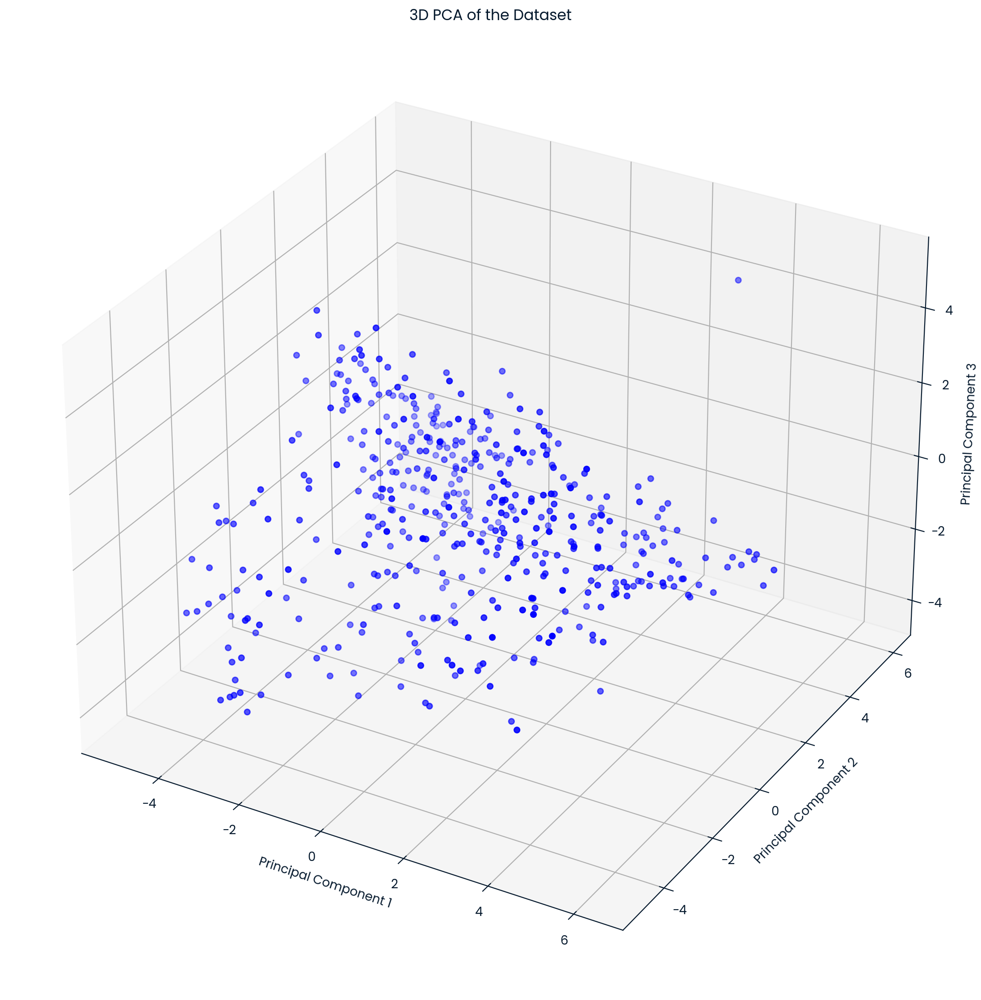

In [45]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

#Transpose the data to have observations as rows and features as columns
data = data.T


# Assuming 'data' is the dataset you want to reduce
# Perform PCA to reduce the data to 3 dimensions
pca = PCA(n_components=3)
reduced_data = pca.fit_transform(data)

# Create a larger 3D scatter plot
fig = plt.figure(figsize=(14, 14))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(reduced_data[:, 0], reduced_data[:, 1], reduced_data[:, 2], c='blue', marker='o')

ax.set_title('3D PCA of the Dataset')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')

plt.show()

In [43]:
# Perform k-means clustering on the observations in the dataset with a number of clusters k greater than 3
file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)


#Transpose the data to have observations as rows and features as columns
data = data.T

k = 4  
kmeans = KMeans(n_clusters=k, random_state=0)
clusters = kmeans.fit_predict(data)

# Add the cluster labels to the original data
data_with_clusters = data.copy()
data_with_clusters['Cluster'] = clusters

# Generate an n × n square matrix M
n = data.shape[0]
M = np.zeros((n, n), dtype=int)
for i in range(n):
    for j in range(n):
        if clusters[i] == clusters[j]:
            M[i, j] = 1

M

array([[1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1]])

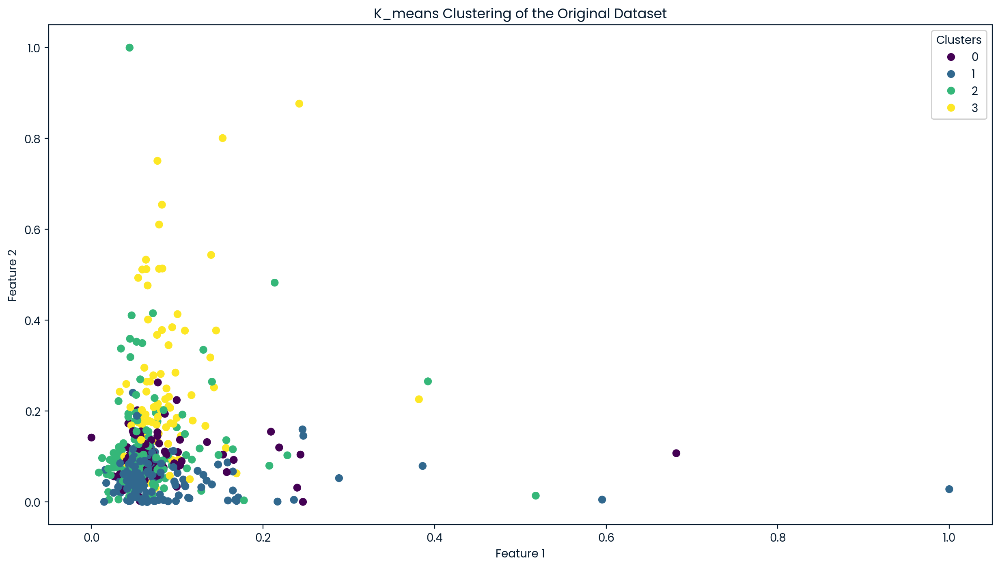

In [6]:
import matplotlib.pyplot as plt

# Assuming 'data' is the original dataset and 'clusters' contains the cluster labels
fig, ax = plt.subplots(figsize=(15, 8))

# Scatter plot of the original data with cluster coloring
scatter = ax.scatter(data.iloc[:, 0], data.iloc[:, 1], c=clusters, cmap='viridis', marker='o')

# Add legend
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

ax.set_title('K_means Clustering of the Original Dataset')
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')

plt.show()

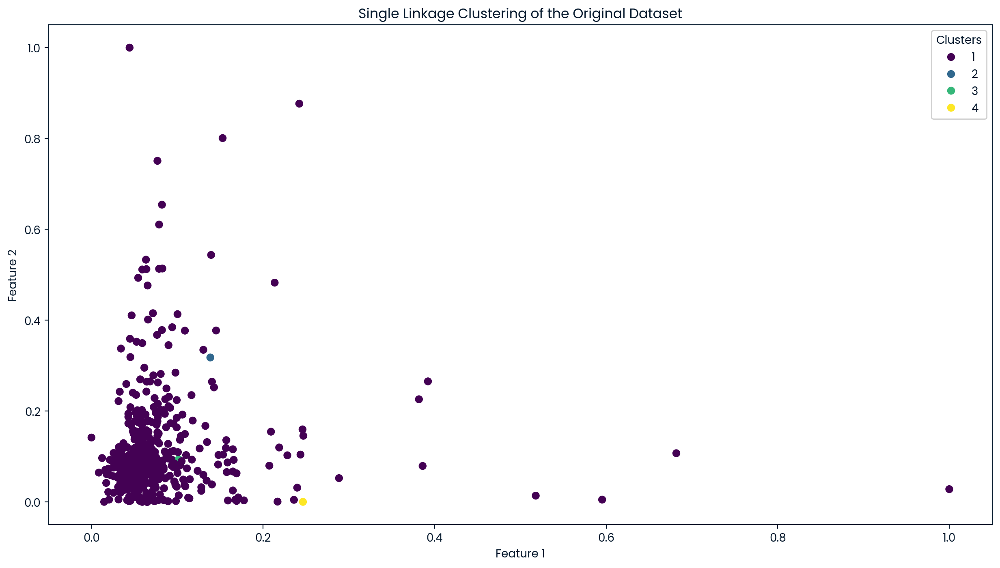

In [7]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, fcluster
import pandas as pd
import numpy as np
# Load the data
file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)
# Transpose the data to have observations as rows and features as columns
data = data.T
# Perform single linkage clustering
Z = linkage(data, method='single')
clusters = fcluster(Z, t=4, criterion='maxclust')

# Add the cluster labels to the original data
data_with_clusters = data.copy()
data_with_clusters['Cluster'] = clusters

# Generate an n × n square matrix M
n = data.shape[0]
M = np.zeros((n, n), dtype=int)
for i in range(n):
    for j in range(n):
        if clusters[i] == clusters[j]:
            M[i, j] = 1

# Scatter plot of the original data with cluster coloring
fig, ax = plt.subplots(figsize=(15, 8))
scatter = ax.scatter(data.iloc[:, 0], data.iloc[:, 1], c=clusters, cmap='viridis', marker='o')

# Add legend
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

ax.set_title('Single Linkage Clustering of the Original Dataset')
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
plt.show()

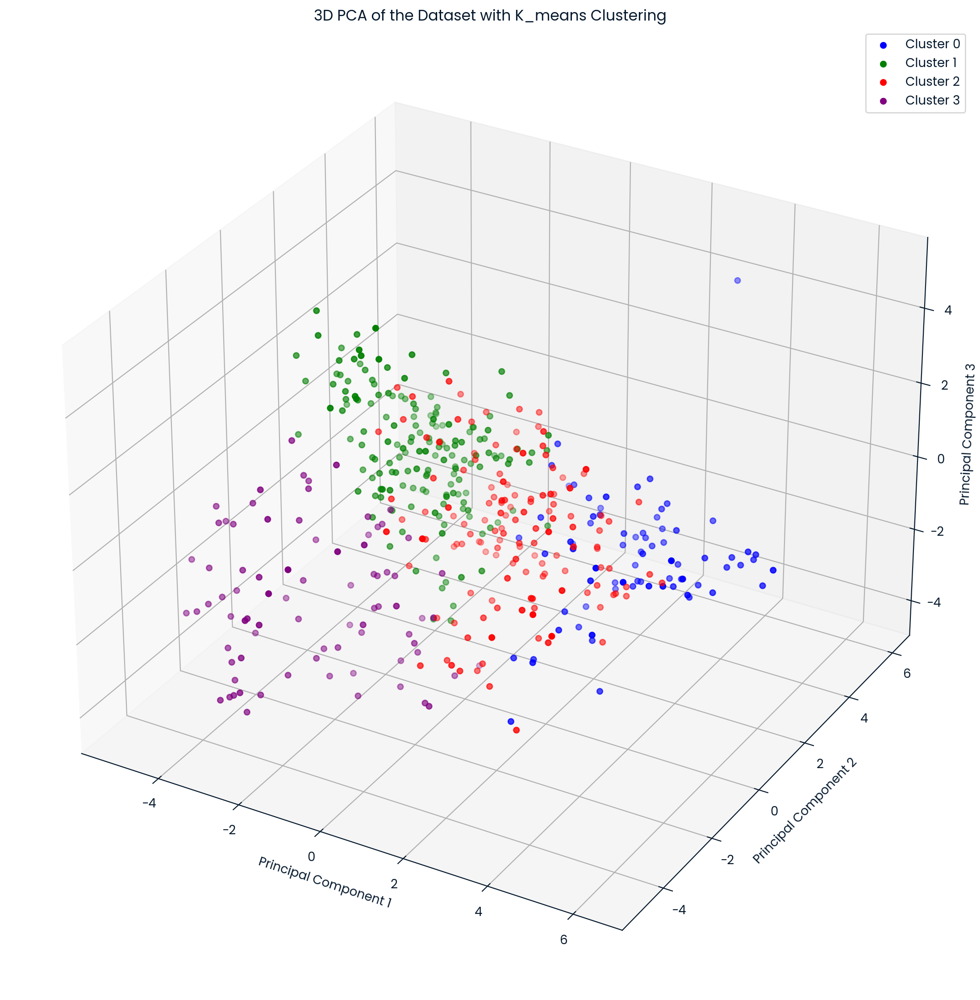

In [46]:
# Visualize the clustering in 3D using the reduced data from PCA
fig = plt.figure(figsize=(14, 14))
ax = fig.add_subplot(111, projection='3d')

# Use different colors for each cluster
colors = ['blue', 'green', 'red', 'purple']
for cluster in range(k):
    cluster_points = reduced_data[clusters == cluster]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], 
               c=colors[cluster], label=f'Cluster {cluster}', marker='o')

ax.set_title('3D PCA of the Dataset with K_means Clustering')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()

plt.show()

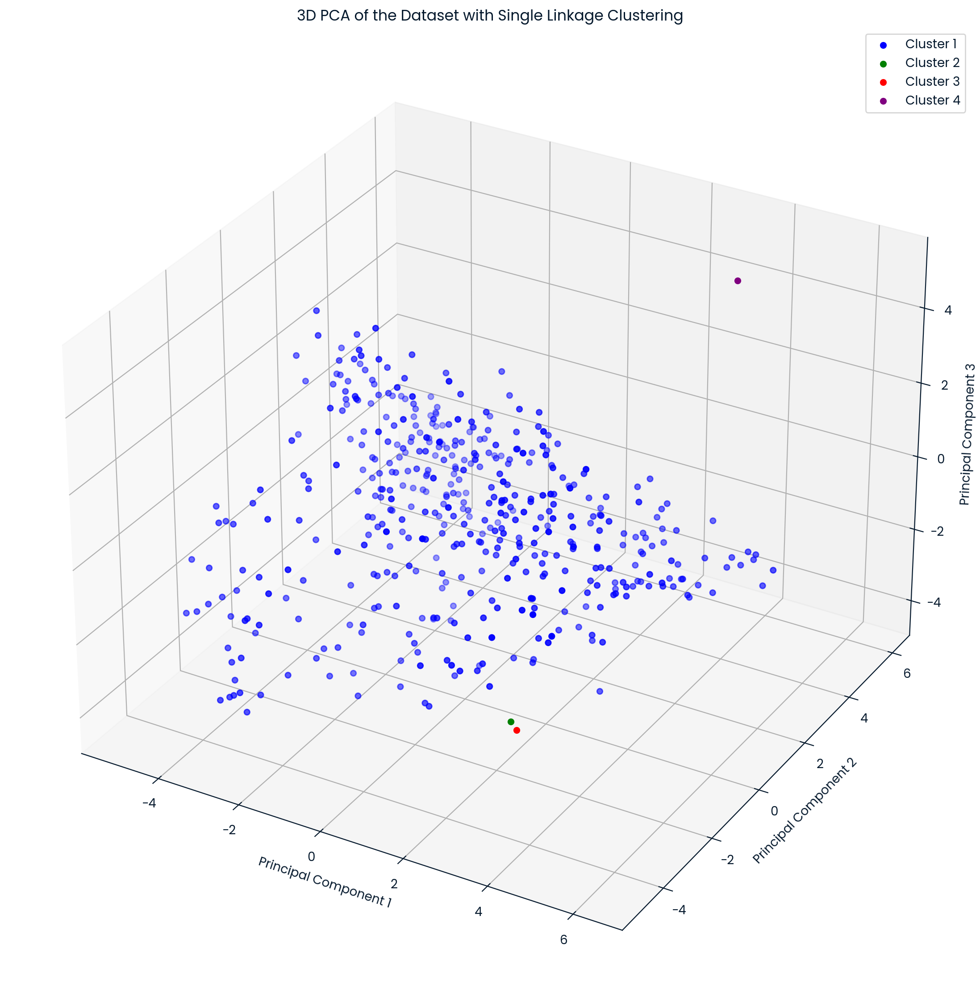

In [9]:
from scipy.cluster.hierarchy import linkage, fcluster
from mpl_toolkits.mplot3d import Axes3D

# Perform single linkage clustering
Z = linkage(reduced_data, method='single')
clusters = fcluster(Z, t=k, criterion='maxclust')

# Visualize the clustering in 3D using the reduced data from PCA
fig = plt.figure(figsize=(14, 14))
ax = fig.add_subplot(111, projection='3d')

# Use different colors for each cluster
colors = ['blue', 'green', 'red', 'purple']
for cluster in range(1, k+1):
    cluster_points = reduced_data[clusters == cluster]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2], 
               c=colors[cluster-1], label=f'Cluster {cluster}', marker='o')

ax.set_title('3D PCA of the Dataset with Single Linkage Clustering')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()

plt.show()

In [5]:
# Perform PCA and keep the first 3 principal components
file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)


#Transpose the data to have observations as rows and features as columns
data = data.T

pca = PCA(n_components=3)
data_reduced = pca.fit_transform(data)

#print(data_reduced.shape)  

# Perform k-means clustering on the reduced-dimensional data
kmeans_reduced = KMeans(n_clusters=k, random_state=0)
clusters_reduced = kmeans_reduced.fit_predict(data_reduced)

# Add the cluster labels to the reduced data
data_reduced_with_clusters = pd.DataFrame(data_reduced, columns=[f'PC{i+1}' for i in range(3)])
data_reduced_with_clusters['Cluster'] = clusters_reduced

# Generate the n x n matrix P
P = np.zeros((n, n), dtype=int)
for i in range(n):
    for j in range(n):
        if clusters_reduced[i] == clusters_reduced[j]:
            P[i, j] = 1

P

array([[1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1],
       [0, 0, 0, ..., 1, 1, 1]])

In [6]:
# Calculate the number of entries that are the same between M and P
same_entries = np.sum(M == P)
same_entries

194341

194341 reflects the number of entries in the matrices M and P that are the same. 

- Matrix M is an n × n matrix where M[i, j] is 1 if the i-th and j-th observations belong to the same cluster based on the original data clustering, and 0 otherwise.
- Matrix P is an n × n matrix where P[i, j] is 1 if the i-th and j-th observations belong to the same cluster based on the PCA-reduced data clustering, and 0 otherwise.

The value 194341 indicates the total number of positions (i, j) where both M and P have the same value (either both 1 or both 0). This can be interpreted as a measure of similarity between the clustering results obtained from the original data and the PCA-reduced data. A higher number suggests that the clustering results are more consistent between the two methods.

Performing Principal Component Analysis (PCA) on the data affected its structure in several ways:

1. **Dimensionality Reduction**: PCA reduced the number of dimensions in the dataset from its original number to three principal components. This reduction helps in simplifying the data while retaining most of the variance present in the original dataset.

2. **Variance Preservation**: The first three principal components capture the maximum variance in the data. This means that the most significant patterns and structures in the data are preserved, even though the dimensionality is reduced.

3. **Orthogonal Transformation**: PCA transforms the original features into a new set of orthogonal (uncorrelated) features. These new features (principal components) are linear combinations of the original features.

4. **Cluster Structure**: By performing k-means clustering on the reduced-dimensional data, the clusters may differ from those obtained using the original data. This is because the clustering algorithm now operates on the principal components, which represent the most significant variance in the data, potentially leading to different cluster assignments.

5. **Matrix Comparison**: The matrices \( M \) and \( P \) represent the cluster assignments in the original and reduced-dimensional data, respectively. The number of same entries between \( M \) and \( P \) indicates how similar the cluster structures are before and after PCA. A high number of same entries suggests that PCA preserved the cluster structure well, while a low number indicates significant changes in the cluster assignments.

In summary, PCA affects the data structure by reducing its dimensionality, preserving variance, transforming features into orthogonal components, and potentially altering the cluster structure when clustering algorithms are applied to the reduced data.

To understand how performing Principal Component Analysis (PCA) affected the structure of the data, you can follow these steps:

1. **Variance Explained**: PCA transforms the data into a new coordinate system where the greatest variance by any projection of the data comes to lie on the first coordinate (called the first principal component), the second greatest variance on the second coordinate, and so on. You can check the explained variance ratio to see how much variance each principal component captures.

    ```python
    # Assuming `pca` is your PCA object
    explained_variance = pca.explained_variance_ratio_
    print(explained_variance)

In [12]:
explained_variance = pca.explained_variance_ratio_
print(explained_variance)

[0.18114903 0.11694861 0.08547751]


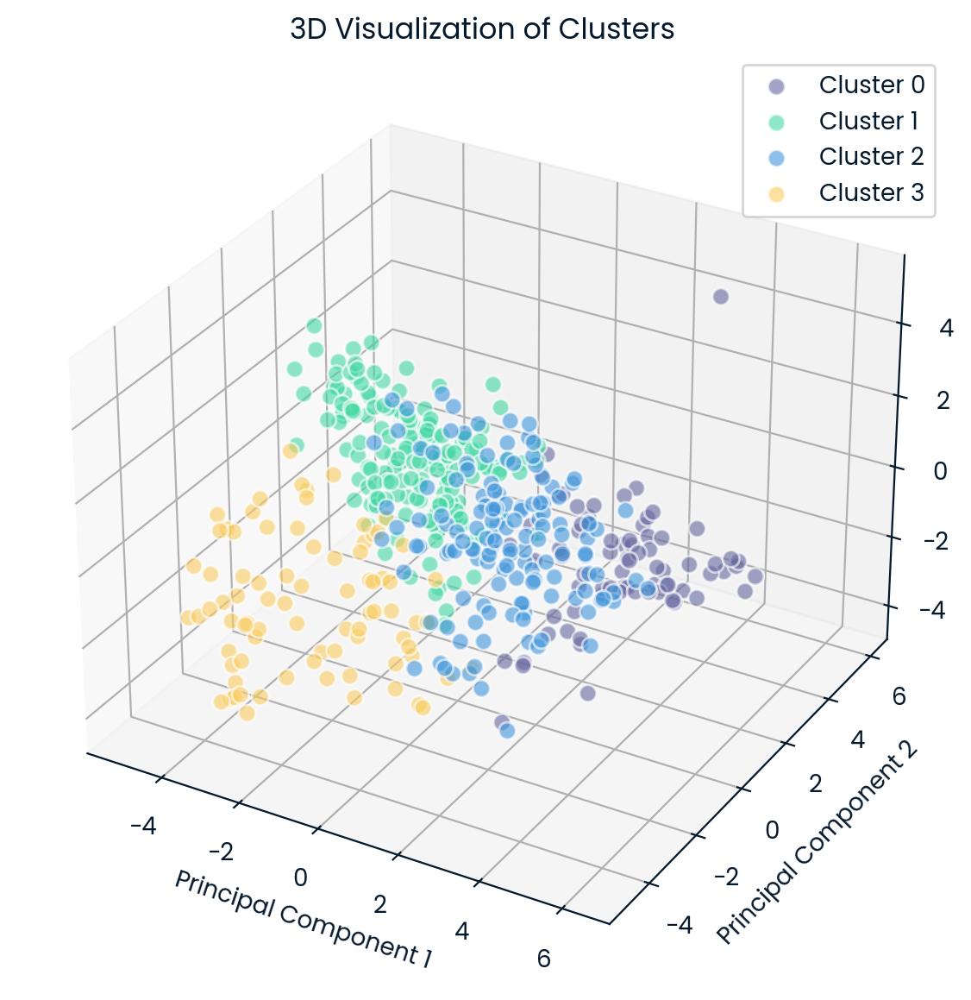

In [47]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)


#Transpose the data to have observations as rows and features as columns
data = data.T

# Perform PCA to reduce the data to 3 dimensions for visualization
pca = PCA(n_components=3)
data_reduced = pca.fit_transform(data)

# Create a DataFrame with the reduced data and cluster labels
data_reduced_with_clusters = pd.DataFrame(data_reduced, columns=['PC1', 'PC2', 'PC3'])
data_reduced_with_clusters['Cluster'] = clusters

# Plot the clusters in 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Define a color map for the clusters
colors = plt.cm.get_cmap('viridis', k)

for cluster in range(k):
    cluster_data = data_reduced_with_clusters[data_reduced_with_clusters['Cluster'] == cluster]
    ax.scatter(cluster_data['PC1'], cluster_data['PC2'], cluster_data['PC3'], 
               label=f'Cluster {cluster}', s=50, alpha=0.6, edgecolors='w')

ax.set_title('3D Visualization of Clusters')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()
plt.show()

In [13]:
from sklearn.cluster import KMeans
import numpy as np
file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

#Transpose the data to have observations as rows and features as columns
data = data.T
# Number of clusters
k = 4  # Adjust k as needed

# Number of times to run k-means with different initial centroids
n_init = 10

# Perform k-means clustering
kmeans_models = []
for i in range(n_init):
    kmeans = KMeans(n_clusters=k, n_init=1, init='random', random_state=i)
    kmeans.fit(data)
    kmeans_models.append(kmeans)

# Extract the cluster labels from each run
cluster_labels_list = [model.labels_ for model in kmeans_models]

# Generate matrices M1,...,M10 indicating whether given pairs of observations are in the same cluster
n_samples = data.shape[0]
M_matrices = []

for idx, labels in enumerate(cluster_labels_list):
    M = np.zeros((n_samples, n_samples), dtype=int)
    for i in range(n_samples):
        for j in range(n_samples):
            if labels[i] == labels[j]:
                M[i, j] = 1
    globals()[f'M{idx+1}'] = M
    M_matrices.append(M)
# M1, M2, ..., M10 matrices are now available as separate variables
M1, M2, M3, M4, M5, M6, M7, M8, M9, M10

(array([[1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]]),
 array([[1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]]),
 array([[1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]]),
 array([[1, 0, 0, ..., 0, 0, 0],
        [0, 1, 1, ..., 0, 0, 0],
        [0, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]]),
 array([[1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
   

In [14]:
import numpy as np

# Assuming M and M1, M2, ..., M10 are defined in the previous cells
M_list = [M1, M2, M3, M4, M5, M6, M7, M8, M9, M10]

for i in range(10):
    shared_entries = np.sum(M_list[i] == M)
    total_elements = M.shape[0] * M.shape[1]
    probability_shared = shared_entries / total_elements
    percentage_shared = probability_shared * 100
    
    print(f"The number of entries that M{i+1} and M share together are: {shared_entries}")
    print(f"The total elements that M{i+1} and M each has: {total_elements}")
    print(f"The probability of elements that are shared among in M{i+1} and M is: {shared_entries}/{total_elements}={probability_shared}")
    print(f"The percentage of elements that are shared among in M{i+1} and M is: {percentage_shared}%")
    print()
    print()

The number of entries that M1 and M share together are: 171869
The total elements that M1 and M each has: 210681
The probability of elements that are shared among in M1 and M is: 171869/210681=0.8157783568523028
The percentage of elements that are shared among in M1 and M is: 81.57783568523028%


The number of entries that M2 and M share together are: 171339
The total elements that M2 and M each has: 210681
The probability of elements that are shared among in M2 and M is: 171339/210681=0.8132627052273342
The percentage of elements that are shared among in M2 and M is: 81.32627052273342%


The number of entries that M3 and M share together are: 171865
The total elements that M3 and M each has: 210681
The probability of elements that are shared among in M3 and M is: 171865/210681=0.815759370802303
The percentage of elements that are shared among in M3 and M is: 81.5759370802303%


The number of entries that M4 and M share together are: 163167
The total elements that M4 and M each has: 21

In [20]:
# Assuming M and M1, M2, ..., M10 are defined in the previous cells
M_list = [M1, M2, M3, M4, M5, M6, M7, M8, M9, M10]

# Initialize a matrix to count the number of times each pair is in the same cluster
pair_count = np.zeros(M.shape)

# Count the number of times each pair is in the same cluster across all runs
for M_i in M_list:
    pair_count += (M_i == M)

# Find pairs that were in the same cluster in at least one run
at_least_one = np.sum(pair_count > 0)

# Find pairs that were in the same cluster in all ten runs
all_ten = np.sum(pair_count == 10)

# Calculate the percentage
percentage_all_ten = (all_ten / at_least_one) * 100

percentage_all_ten

58.55630075801804

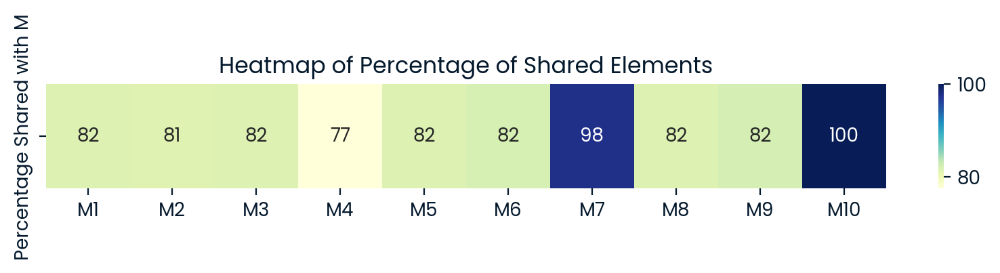

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming M and M1, M2, ..., M10 are defined in the previous cells
M_list = [M1, M2, M3, M4, M5, M6, M7, M8, M9, M10]

# Initialize a list to store the percentage of shared elements
percentage_shared_list = []

for i in range(10):
    shared_entries = np.sum(M_list[i] == M)
    total_elements = M.shape[0] * M.shape[1]
    probability_shared = shared_entries / total_elements
    percentage_shared = probability_shared * 100
    percentage_shared_list.append(percentage_shared)

# Create a heatmap
plt.figure(figsize=(10, 1))
sns.heatmap([percentage_shared_list], annot=True, cmap="YlGnBu", cbar=True, xticklabels=[f'M{i+1}' for i in range(10)], yticklabels=['Percentage Shared with M'], fmt='.0f')
plt.title('Heatmap of Percentage of Shared Elements')
plt.show()

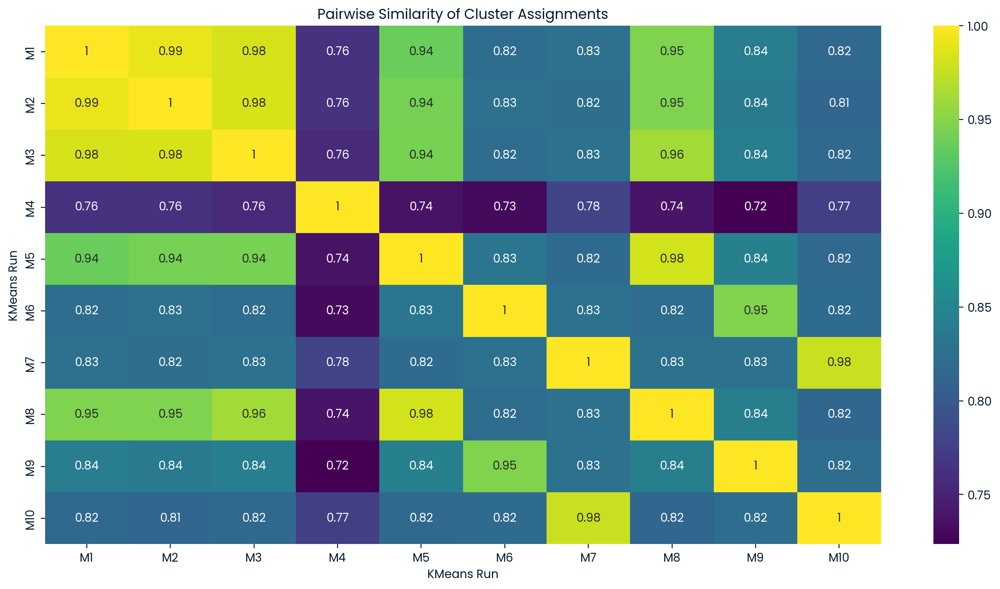

0.8623059507027212

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the pairwise similarity between the cluster label matrices
similarity_matrix = np.zeros((n_init, n_init))

for i in range(n_init):
    for j in range(n_init):
        similarity_matrix[i, j] = np.sum(globals()[f'M{i+1}'] == globals()[f'M{j+1}']) / (n_samples * n_samples)

# Plot the similarity matrix
plt.figure(figsize=(16, 8))
sns.heatmap(similarity_matrix, annot=True, cmap='viridis', cbar=True, xticklabels=[f'M{i+1}' for i in range(n_init)], yticklabels=[f'M{i+1}' for i in range(n_init)])
plt.title('Pairwise Similarity of Cluster Assignments')
plt.xlabel('KMeans Run')
plt.ylabel('KMeans Run')
plt.show()

# Calculate the average similarity
average_similarity = np.mean(similarity_matrix)
average_similarity

In [17]:
import numpy as np

# Calculate the pairwise similarity between the M matrices
def calculate_similarity(M1, M2):
    return np.sum(M1 == M2) / (M1.shape[0] * M1.shape[1])

# Calculate the average similarity across all pairs of M matrices
similarities = []
for i in range(len(M_matrices)):
    for j in range(i + 1, len(M_matrices)):
        similarity = calculate_similarity(M_matrices[i], M_matrices[j])
        similarities.append(similarity)

average_similarity = np.mean(similarities)
print(f"Average similarity between different k-means runs: {average_similarity:.4f}")

# Determine robustness based on average similarity
threshold = 0.9  # Define a threshold for robustness
if average_similarity >= threshold:
    print("The results of k-means on this dataset are robust to the initial cluster centroid values chosen.")
else:
    print("The results of k-means on this dataset are not robust to the initial cluster centroid values chosen.")

Average similarity between different k-means runs: 0.8470
The results of k-means on this dataset are not robust to the initial cluster centroid values chosen.


The previous code block calculates the robustness of k-means clustering results by comparing the similarity of different clustering outcomes. Here's a step-by-step interpretation of the results:

1. **Importing Libraries**: The code starts by importing the `numpy` library, which is essential for numerical operations.

2. **Defining Similarity Function**: The function `calculate_similarity` is defined to compute the pairwise similarity between two matrices `M1` and `M2`. The similarity is calculated as the proportion of elements that are the same in both matrices.

3. **Calculating Pairwise Similarities**: The code then initializes an empty list `similarities` to store the similarity values. It iterates over all pairs of matrices in `M_matrices` (assumed to be a list of matrices resulting from different k-means runs) and calculates the similarity for each pair using the `calculate_similarity` function. These similarity values are appended to the `similarities` list.

4. **Average Similarity**: The average similarity across all pairs of matrices is computed using `np.mean(similarities)`. This value represents the overall consistency of the clustering results across different runs of k-means.

5. **Printing Average Similarity**: The average similarity is printed to the console with a precision of four decimal places.

6. **Determining Robustness**: A threshold value of 0.9 is defined to determine the robustness of the k-means results. If the average similarity is greater than or equal to this threshold, the results are considered robust, meaning that the clustering outcomes are consistent regardless of the initial cluster centroids. Otherwise, the results are not considered robust.

7. **Output Message**: Based on the comparison with the threshold, an appropriate message is printed to indicate whether the k-means results are robust or not.

In summary, the code evaluates the robustness of k-means clustering by measuring the consistency of clustering results across different runs. If the average similarity is high (above the threshold), the results are deemed robust; otherwise, they are not.

### Cluster Centroid

In the context of clustering algorithms, a **cluster centroid** is a central point that represents the average position of all the points within a cluster. It is essentially the mean of all the data points in that cluster. The centroid is used as a reference point to define the cluster and is crucial in algorithms like K-means clustering.

#### Key Points:
- **Definition**: The centroid is the arithmetic mean position of all the points in the cluster.
- **Calculation**: For a cluster with points \( x_1, x_2, \ldots, x_n \), the centroid \( C \) is calculated as:
  \[
  C = \frac{1}{n} \sum_{i=1}^{n} x_i
  \]
- **Role in Clustering**: In K-means clustering, centroids are iteratively updated to minimize the distance between the points and their respective centroids, thereby refining the clusters.

#### Example:
Consider a 2D space with the following points in a cluster: \((2, 3)\), \((3, 4)\), \((5, 6)\). The centroid \( C \) of this cluster is calculated as:
\[
C = \left( \frac{2+3+5}{3}, \frac{3+4+6}{3} \right) = \left( \frac{10}{3}, \frac{13}{3} \right) \approx (3.33, 4.33)
\]

The centroid \((3.33, 4.33)\) represents the average position of the points in the cluster.

#### Importance:
- **Cluster Representation**: The centroid provides a simple and effective way to represent the entire cluster.
- **Distance Measurement**: It is used to measure the distance between clusters and to assign new points to the nearest cluster during the clustering process.

Understanding the concept of a cluster centroid is fundamental to grasping how clustering algorithms like K-means work and how they partition data into meaningful groups.

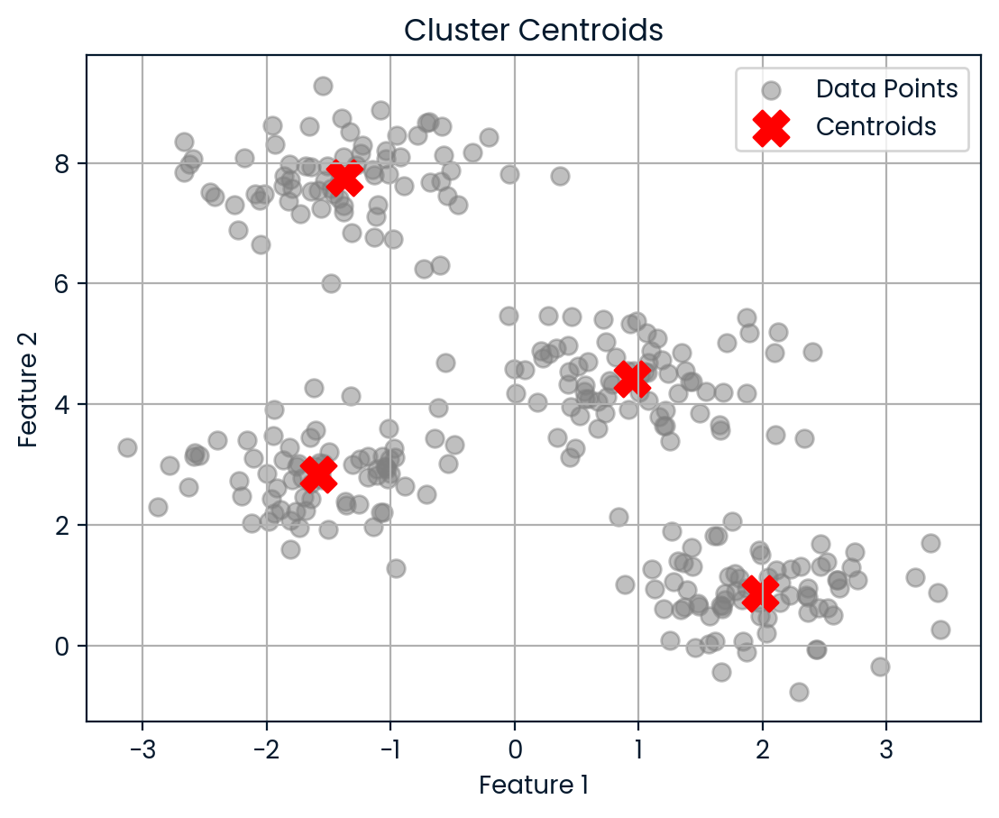

In [20]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans

# Generate sample data
X, _ = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=0)

# Fit KMeans
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)
centroids = kmeans.cluster_centers_

# Plot the data points
plt.scatter(X[:, 0], X[:, 1], s=50, c='gray', marker='o', alpha=0.5, label='Data Points')

# Plot the centroids
plt.scatter(centroids[:, 0], centroids[:, 1], s=200, c='red', marker='X', label='Centroids')

# Add labels and title
plt.title('Cluster Centroids')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.grid(True)
plt.show()

In [18]:
import numpy as np

# Create a boolean array to track pairs of observations that are in the same cluster in at least one run
n_observations = M_matrices[0].shape[0]
same_cluster_at_least_once = np.zeros((n_observations, n_observations), dtype=bool)

# Create a boolean array to track pairs of observations that are in the same cluster in all runs
same_cluster_in_all_runs = np.ones((n_observations, n_observations), dtype=bool)

# Iterate over all pairs of observations
for i in range(n_observations):
    for j in range(i + 1, n_observations):
        in_same_cluster = [np.array_equal(M[i], M[j]) for M in M_matrices]
        if any(in_same_cluster):
            same_cluster_at_least_once[i, j] = True
        if not all(in_same_cluster):
            same_cluster_in_all_runs[i, j] = False

# Calculate the percentage of pairs that were in the same cluster in all runs out of those that were in the same cluster in at least one run
total_pairs_in_same_cluster_at_least_once = np.sum(same_cluster_at_least_once)
total_pairs_in_same_cluster_in_all_runs = np.sum(same_cluster_at_least_once & same_cluster_in_all_runs)

percentage = (total_pairs_in_same_cluster_in_all_runs / total_pairs_in_same_cluster_at_least_once) * 100
percentage

17.49130631992743

In [19]:
import numpy as np

# Check robustness
percentages=[]
# Compare M1 to M10 with M using for loop
for i in M_list:
    percentages.append(np.sum(i==M)/(M.shape[0]*M.shape[1]))

# M_list has the shape 10*459*459

# find the indices that appears in at least one of the 10 matrices
counter_any=0
for i in range(M_list[0].shape[0]):
    for j in range(M_list[0].shape[1]):
        found=False
        for k in range(len(M_list)):
            if M_list[k][i,j]==1:
                found=True
                break # for faster output
        if found:
            counter_any+=1

print(counter_any)

# find the indices that appears in all 10 matrices
counter_all=0
for i in range(M_list[0].shape[0]):
    for j in range(M_list[0].shape[1]):
        found=True
        for k in range(len(M_list)):
            if not M_list[k][i,j]==1:
                found=False
                break # for faster output
        if found:
            counter_all+=1
print(counter_all)

percent_all_runs=counter_all/counter_any*100

# divide counter_all by counter_any to determine the ratio/ percentage of same cluster in all 10 runs out of same cluster in at least 1 run
print("\nThe percentage were in the same cluster in all ten runs compared to the same cluster in at least one run is: ")
print(str(counter_all)+"/"+str(counter_any)+"="+str(percent_all_runs)+"%")

106283
18969

The percentage were in the same cluster in all ten runs compared to the same cluster in at least one run is: 
18969/106283=17.847633205686705%


In [2]:
from scipy.cluster.hierarchy import linkage, fcluster
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)


#Transpose the data to have observations as rows and features as columns
data = data.T

pca = PCA(n_components=3)
data_reduced = pca.fit_transform(data)

# Perform single linkage clustering
Z = linkage(data_reduced, method='single')
k = 4  # Define the number of clusters
clusters = fcluster(Z, k, criterion='maxclust')

# Create the S matrix
n_observations = data_reduced.shape[0]
S_matrix = np.zeros((n_observations, n_observations), dtype=int)

for i in range(n_observations):
    for j in range(n_observations):
        if clusters[i] == clusters[j]:
            S_matrix[i, j] = 1

S_matrix

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

In [22]:
# Determine the number of entries S_matrix has in common with P
common_entries = np.sum(S_matrix == P)
common_entries
print(common_entries)

# Calculate the percentage of elements that are shared between S_matrix and P
total_elements = S_matrix.size
percentage_shared_between_S_and_P = (common_entries / total_elements) * 100
percentage_shared_between_S_and_P

57147


27.12489498341094

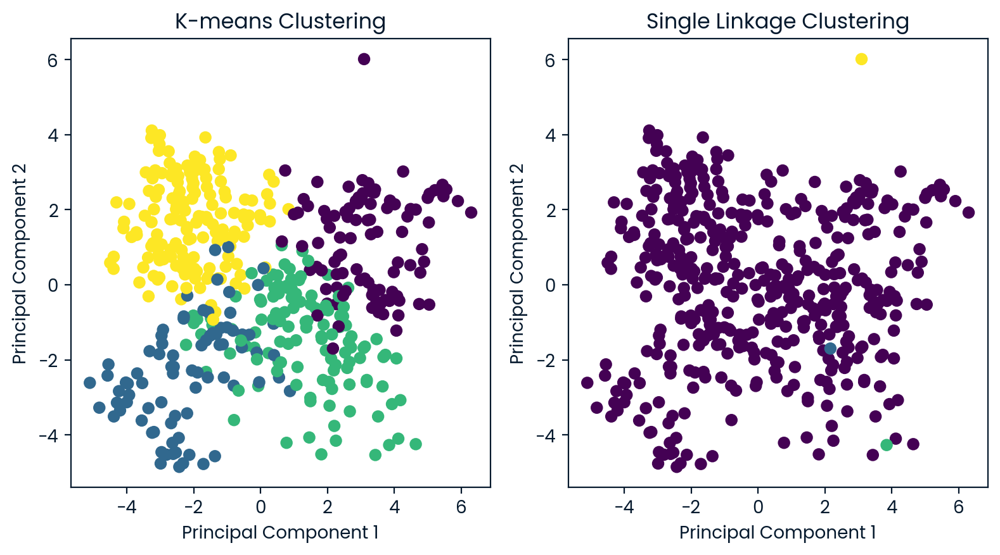

In [25]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Perform k-means clustering
kmeans = KMeans(n_clusters=k, random_state=0).fit(data_reduced)
kmeans_clusters = kmeans.labels_

# Create scatter plot for k-means clustering
plt.figure(figsize=(8, 4.5))

plt.subplot(1, 2, 1)
plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=kmeans_clusters, cmap='viridis', marker='o')
plt.title('K-means Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

# Create scatter plot for single linkage clustering
plt.subplot(1, 2, 2)
plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=clusters, cmap='viridis', marker='o')
plt.title('Single Linkage Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')

plt.tight_layout()
plt.show()

K-means clustering and single-linkage clustering tend to produce different kinds of cluster shapes due to their underlying algorithms:

1. **K-means Clustering**:
   - **Cluster Shape**: K-means clustering tends to produce clusters that are roughly spherical or circular in shape. This is because the algorithm minimizes the variance within each cluster, effectively creating clusters that are equidistant from the cluster centroid.
   - **Limitations**: K-means may struggle with clusters of varying sizes and densities, and it is not well-suited for identifying clusters with irregular shapes.

2. **Single-Linkage Clustering**:
   - **Cluster Shape**: Single-linkage clustering, also known as the nearest-neighbor method, can produce clusters of arbitrary shapes. This method links clusters based on the minimum distance between points in different clusters, allowing it to form elongated or irregularly shaped clusters.
   - **Limitations**: Single-linkage clustering is sensitive to noise and outliers, which can lead to the chaining phenomenon where clusters are formed by linking points in a chain-like manner.

In summary, K-means clustering is best for spherical clusters, while single-linkage clustering can identify clusters with more complex shapes but may be affected by noise and outliers.

In [26]:
import numpy as np
from sklearn.mixture import GaussianMixture
import pandas as pd
from sklearn.decomposition import PCA

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

pca = PCA(n_components=3)
reduced_data = pca.fit_transform(data)

# Define the number of clusters
k = 4 

# Fit the Gaussian Mixture Model
gmm = GaussianMixture(n_components=k, random_state=42)
gmm.fit(reduced_data)

# Get the probabilities of each point belonging to each cluster
probabilities = gmm.predict_proba(reduced_data)

# Create the matrix E
n_samples = reduced_data.shape[0]
E = np.zeros((n_samples, n_samples))

for i in range(n_samples):
    for j in range(n_samples):
        E[i, j] = np.dot(probabilities[i], probabilities[j])

print(E)
print(E.shape)
# E is now the matrix where E[i, j] is the probability that observations i and j are in the same cluster

[[9.80072507e-01 1.35645643e-02 2.13703202e-09 ... 1.00650519e-02
  1.00661729e-02 1.00650519e-02]
 [1.35645643e-02 9.92882699e-01 3.73593351e-11 ... 9.96428595e-01
  9.96427459e-01 9.96428595e-01]
 [2.13703202e-09 3.73593351e-11 9.99999231e-01 ... 2.97568826e-11
  2.97593180e-11 2.97568827e-11]
 ...
 [1.00650519e-02 9.96428595e-01 2.97568826e-11 ... 1.00000000e+00
  9.99998856e-01 1.00000000e+00]
 [1.00661729e-02 9.96427459e-01 2.97593180e-11 ... 9.99998856e-01
  9.99997712e-01 9.99998856e-01]
 [1.00650519e-02 9.96428595e-01 2.97568827e-11 ... 1.00000000e+00
  9.99998856e-01 1.00000000e+00]]
(2207, 2207)


In [27]:
# Calculate the percentage of observations that have at least two different clusters 
# with a probability greater than 1%

# Threshold for the probability
threshold = 0.01

# Count the number of observations that meet the criteria
count = 0
for prob in probabilities:
    if np.sum(prob > threshold) >= 2:
        count += 1

# Calculate the percentage
percentage = (count / n_samples) * 100

percentage

25.509741730856366

The result from the previous code block calculates the percentage of observations in the dataset that have at least two different clusters with a probability greater than 1%. This percentage is a measure of how many data points are not strongly associated with a single cluster, indicating some level of uncertainty or overlap between clusters.

Here's a step-by-step interpretation of the result:

1. **Threshold Definition**: The threshold for the probability is set to 1% (0.01). This means we are interested in observations that have at least two cluster probabilities greater than 1%.

2. **Counting Observations**: The code iterates through each observation's cluster probabilities. For each observation, it checks if there are at least two cluster probabilities that exceed the 1% threshold. If so, it increments the count.

3. **Percentage Calculation**: The count of such observations is then divided by the total number of observations (`n_samples`) and multiplied by 100 to get the percentage.

4. **Result**: The final result is the percentage of observations that have at least two different clusters with a probability greater than 1%.

This percentage can provide insights into the clustering quality. A high percentage might indicate that many data points are not clearly assigned to a single cluster, suggesting that the clusters are not well-separated. Conversely, a low percentage would indicate that most data points are strongly associated with a single cluster, suggesting well-defined clusters.

The exact percentage value would be displayed as the output of the last code block.

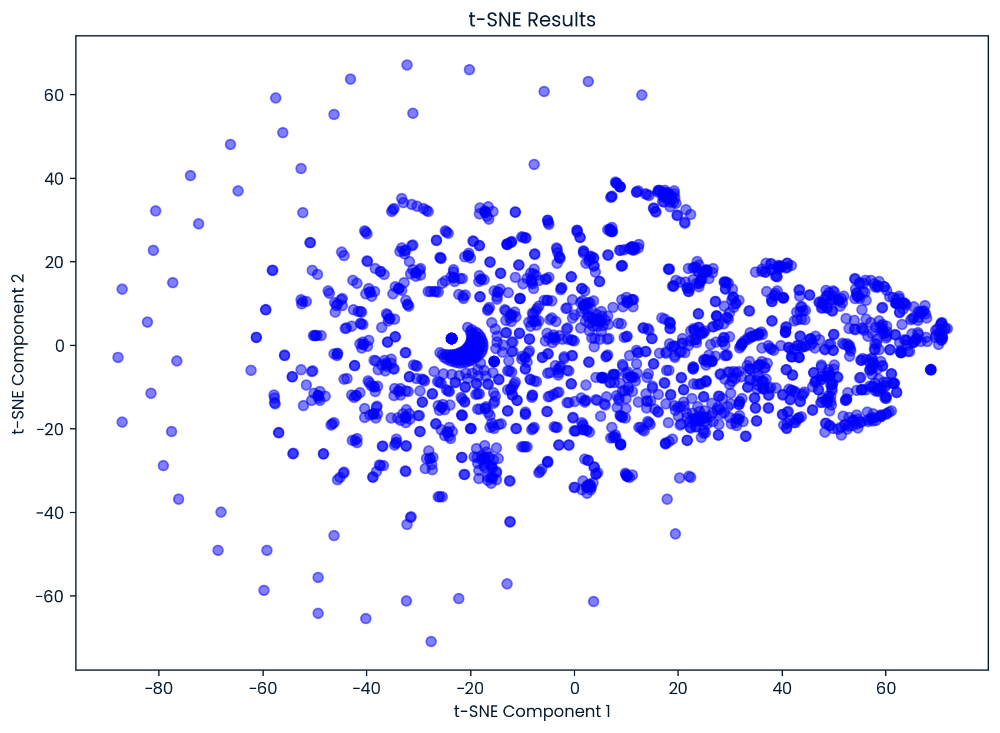

In [29]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Run t-SNE on the full-dimensional dataset
tsne = TSNE(n_components=2, perplexity=30, n_iter=1000, random_state=42)
tsne_results = tsne.fit_transform(data)

# Plot the results
plt.figure(figsize=(10, 7))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c='blue', alpha=0.5)
plt.title('t-SNE Results')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

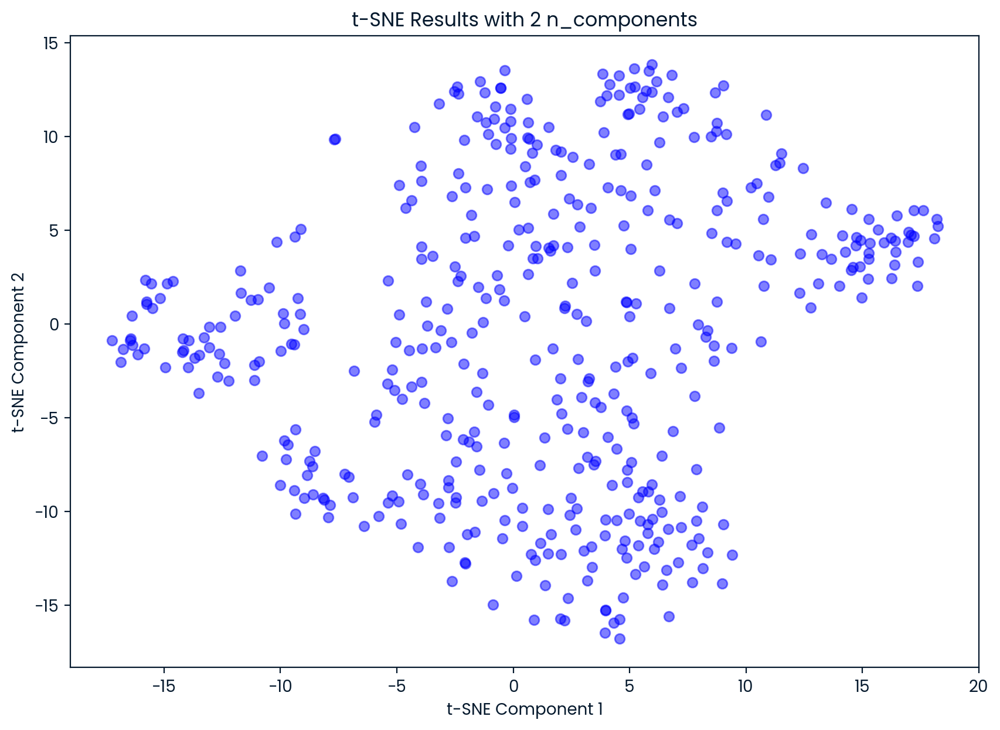

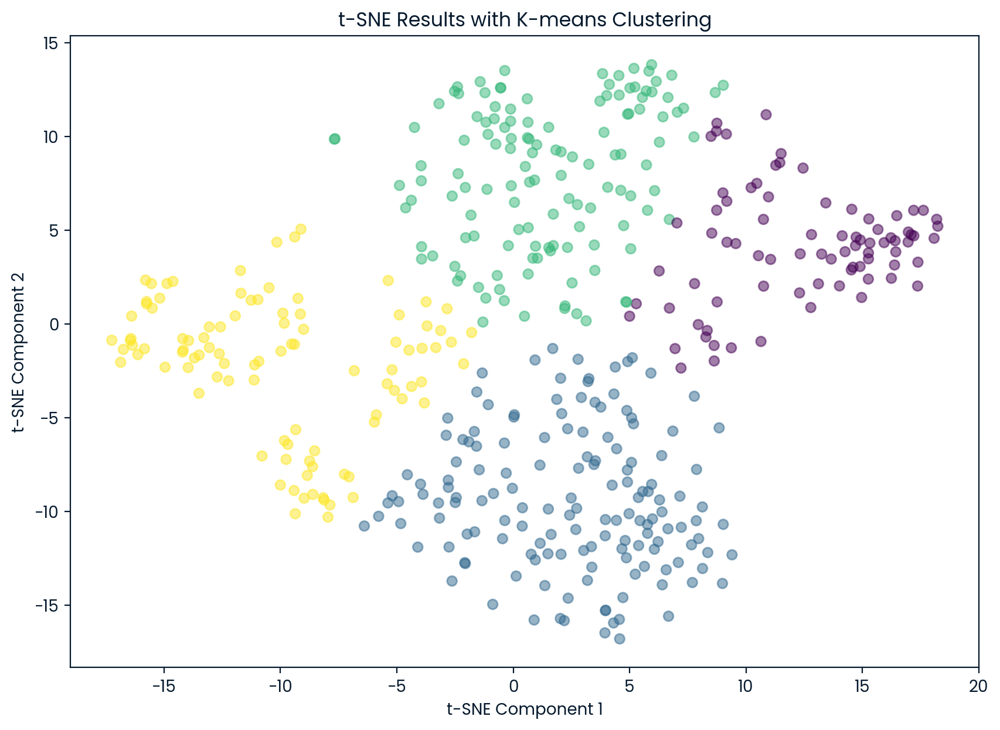

In [30]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

#Transpose the data to have observations as rows and features as columns
data = data.T

# Run t-SNE on the full-dimensional dataset with new tuning parameters
tsne = TSNE(n_components=2, perplexity=40, n_iter=1500, learning_rate=200, random_state=0)
tsne_results = tsne.fit_transform(data)

# Plot the results
plt.figure(figsize=(10, 7))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c='blue', alpha=0.5)
plt.title('t-SNE Results with 2 n_components')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

from sklearn.cluster import KMeans

# Perform K-means clustering on the t-SNE results
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans_labels = kmeans.fit_predict(tsne_results)

# Plot the clustered results
plt.figure(figsize=(10, 7))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
plt.title('t-SNE Results with K-means Clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

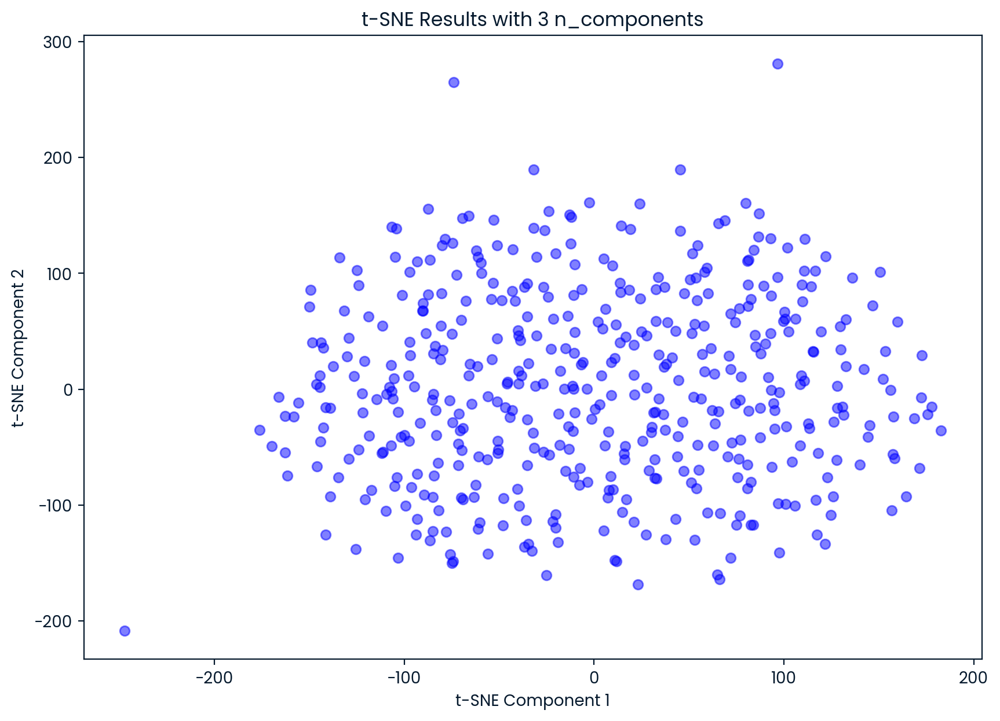

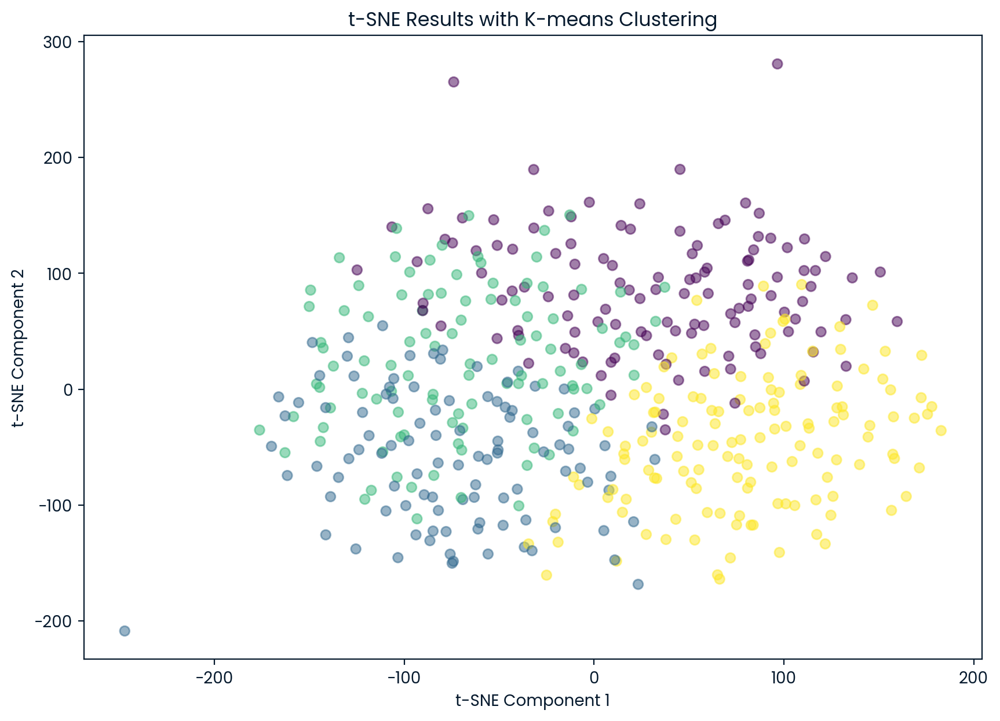

In [2]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import pandas as pd
file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)


#Transpose the data to have observations as rows and features as columns
data = data.T


# Run t-SNE on the full-dimensional dataset with new tuning parameters
tsne = TSNE(n_components=3, perplexity=40, n_iter=1500, learning_rate=200, random_state=0)
tsne_results = tsne.fit_transform(data)

# Plot the results
plt.figure(figsize=(10, 7))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c='blue', alpha=0.5)
plt.title('t-SNE Results with 3 n_components')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()


from sklearn.cluster import KMeans

# Perform K-means clustering on the t-SNE results
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans_labels = kmeans.fit_predict(tsne_results)

# Plot the clustered results
plt.figure(figsize=(10, 7))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
plt.title('t-SNE Results with K-means Clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.show()

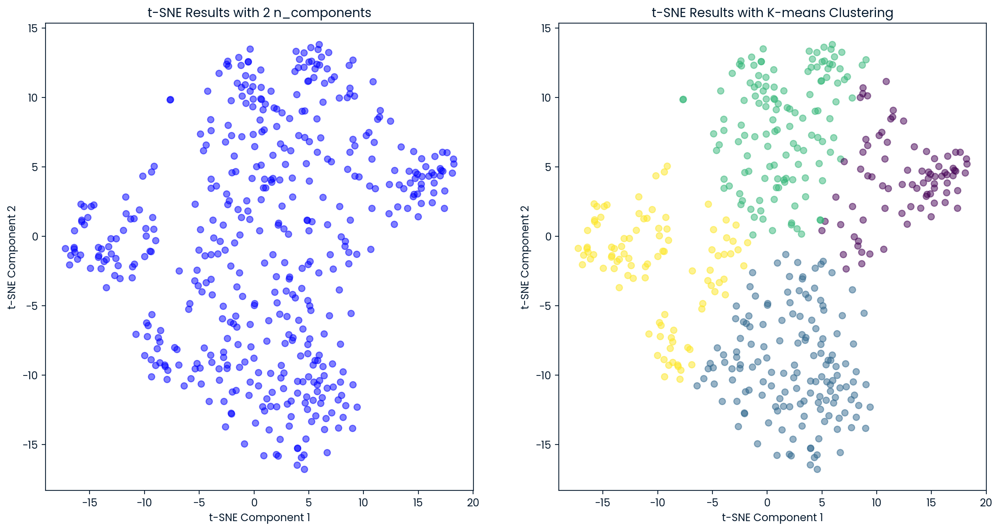

In [32]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import pandas as pd

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

# Transpose the data to have observations as rows and features as columns
data = data.T

# Run t-SNE on the full-dimensional dataset with new tuning parameters
tsne = TSNE(n_components=2, perplexity=40, n_iter=1500, learning_rate=200, random_state=0)
tsne_results = tsne.fit_transform(data)

from sklearn.cluster import KMeans

# Perform K-means clustering on the t-SNE results
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans_labels = kmeans.fit_predict(tsne_results)

# Plot the results
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# Plot t-SNE results
ax[0].scatter(tsne_results[:, 0], tsne_results[:, 1], c='blue', alpha=0.5)
ax[0].set_title('t-SNE Results with 2 n_components')
ax[0].set_xlabel('t-SNE Component 1')
ax[0].set_ylabel('t-SNE Component 2')

# Plot t-SNE results with K-means clustering
ax[1].scatter(tsne_results[:, 0], tsne_results[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
ax[1].set_title('t-SNE Results with K-means Clustering')
ax[1].set_xlabel('t-SNE Component 1')
ax[1].set_ylabel('t-SNE Component 2')

plt.show()

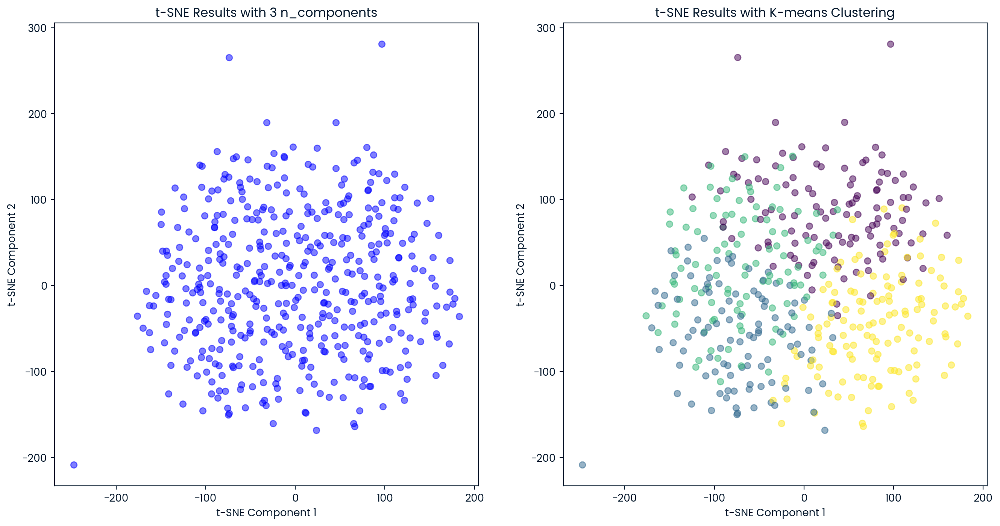

In [33]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import pandas as pd

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

# Transpose the data to have observations as rows and features as columns
data = data.T

# Run t-SNE on the full-dimensional dataset with new tuning parameters
tsne = TSNE(n_components=3, perplexity=40, n_iter=1500, learning_rate=200, random_state=0)
tsne_results = tsne.fit_transform(data)

from sklearn.cluster import KMeans

# Perform K-means clustering on the t-SNE results
kmeans = KMeans(n_clusters=4, random_state=0)
kmeans_labels = kmeans.fit_predict(tsne_results)

# Plot the results
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# Plot t-SNE results
ax[0].scatter(tsne_results[:, 0], tsne_results[:, 1], c='blue', alpha=0.5)
ax[0].set_title('t-SNE Results with 3 n_components')
ax[0].set_xlabel('t-SNE Component 1')
ax[0].set_ylabel('t-SNE Component 2')

# Plot t-SNE results with K-means clustering
ax[1].scatter(tsne_results[:, 0], tsne_results[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
ax[1].set_title('t-SNE Results with K-means Clustering')
ax[1].set_xlabel('t-SNE Component 1')
ax[1].set_ylabel('t-SNE Component 2')

plt.show()

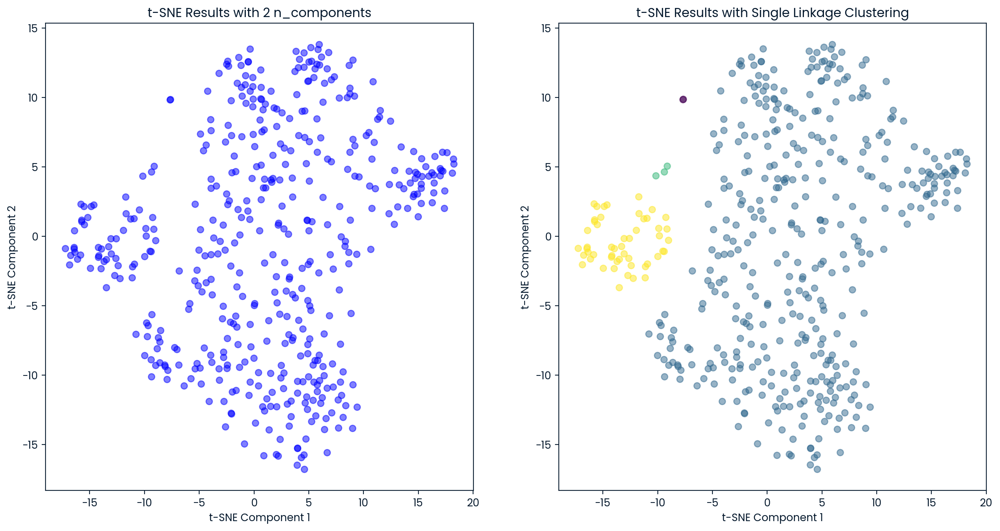

In [34]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import pandas as pd
from scipy.cluster.hierarchy import single, fcluster
from scipy.spatial.distance import pdist

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

# Transpose the data to have observations as rows and features as columns
data = data.T

# Run t-SNE on the full-dimensional dataset with new tuning parameters
tsne = TSNE(n_components=2, perplexity=40, n_iter=1500, learning_rate=200, random_state=0)
tsne_results = tsne.fit_transform(data)

# Perform single linkage clustering on the t-SNE results
distance_matrix = pdist(tsne_results)
linkage_matrix = single(distance_matrix)
single_linkage_labels = fcluster(linkage_matrix, t=4, criterion='maxclust')

# Plot the results
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# Plot t-SNE results
ax[0].scatter(tsne_results[:, 0], tsne_results[:, 1], c='blue', alpha=0.5)
ax[0].set_title('t-SNE Results with 2 n_components')
ax[0].set_xlabel('t-SNE Component 1')
ax[0].set_ylabel('t-SNE Component 2')

# Plot t-SNE results with single linkage clustering
ax[1].scatter(tsne_results[:, 0], tsne_results[:, 1], c=single_linkage_labels, cmap='viridis', alpha=0.5)
ax[1].set_title('t-SNE Results with Single Linkage Clustering')
ax[1].set_xlabel('t-SNE Component 1')
ax[1].set_ylabel('t-SNE Component 2')

plt.show()

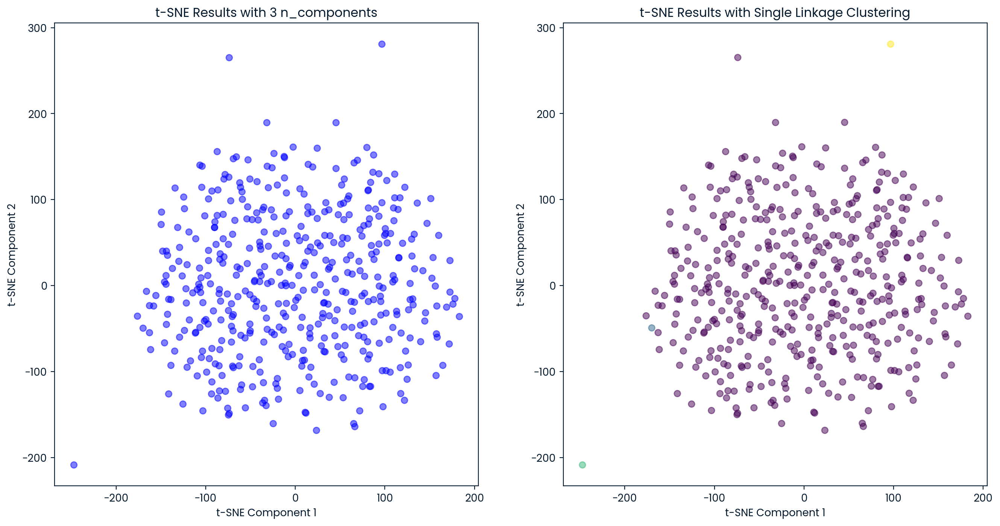

In [35]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import pandas as pd
from scipy.cluster.hierarchy import single, fcluster
from scipy.spatial.distance import pdist

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

# Transpose the data to have observations as rows and features as columns
data = data.T

# Run t-SNE on the full-dimensional dataset with new tuning parameters
tsne = TSNE(n_components=3, perplexity=40, n_iter=1500, learning_rate=200, random_state=0)
tsne_results = tsne.fit_transform(data)

# Perform single linkage clustering on the t-SNE results
distance_matrix = pdist(tsne_results)
linkage_matrix = single(distance_matrix)
single_linkage_labels = fcluster(linkage_matrix, t=4, criterion='maxclust')

# Plot the results
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# Plot t-SNE results
ax[0].scatter(tsne_results[:, 0], tsne_results[:, 1], c='blue', alpha=0.5)
ax[0].set_title('t-SNE Results with 3 n_components')
ax[0].set_xlabel('t-SNE Component 1')
ax[0].set_ylabel('t-SNE Component 2')

# Plot t-SNE results with single linkage clustering
ax[1].scatter(tsne_results[:, 0], tsne_results[:, 1], c=single_linkage_labels, cmap='viridis', alpha=0.5)
ax[1].set_title('t-SNE Results with Single Linkage Clustering')
ax[1].set_xlabel('t-SNE Component 1')
ax[1].set_ylabel('t-SNE Component 2')

plt.show()

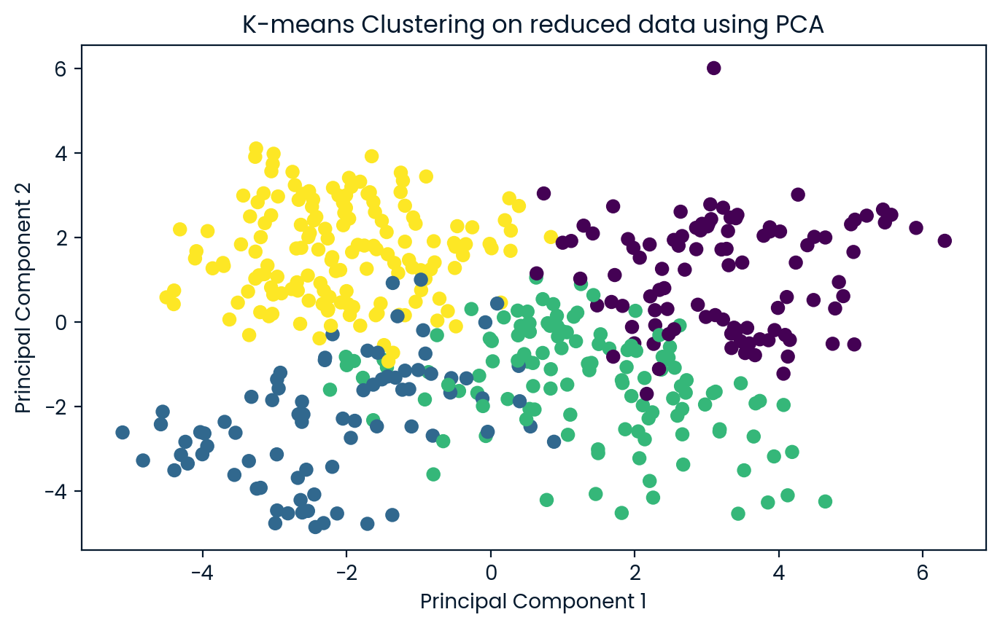

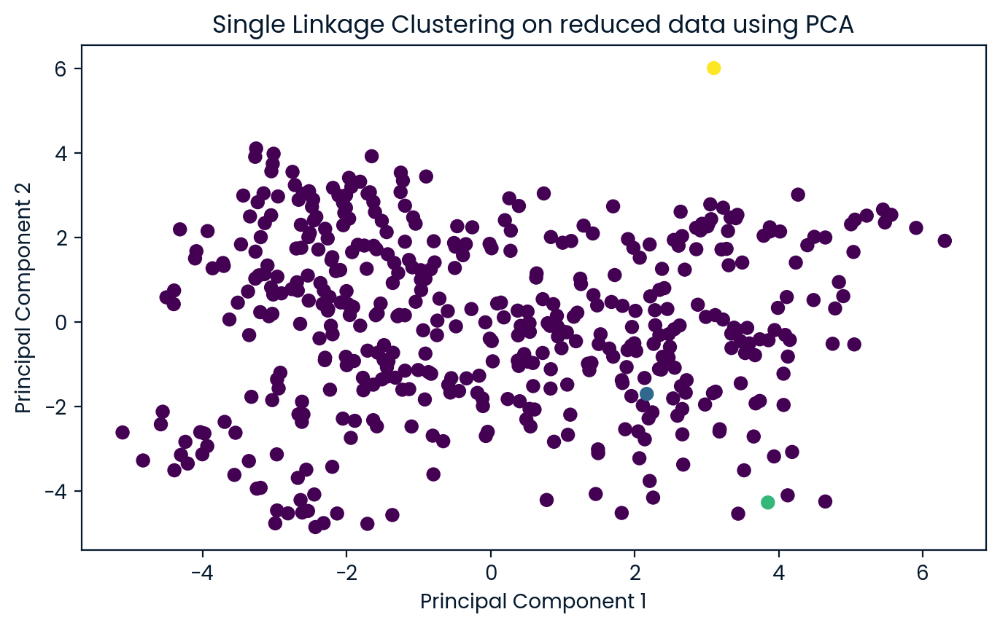

In [36]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Perform k-means clustering
kmeans = KMeans(n_clusters=4, random_state=0).fit(data_reduced)
kmeans_clusters = kmeans.labels_

# Create scatter plot for k-means clustering
plt.figure(figsize=(8, 4.5))
plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=kmeans_clusters, cmap='viridis', marker='o')
plt.title('K-means Clustering on reduced data using PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

# Create scatter plot for single linkage clustering
plt.figure(figsize=(8, 4.5))
plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=clusters, cmap='viridis', marker='o')
plt.title('Single Linkage Clustering on reduced data using PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

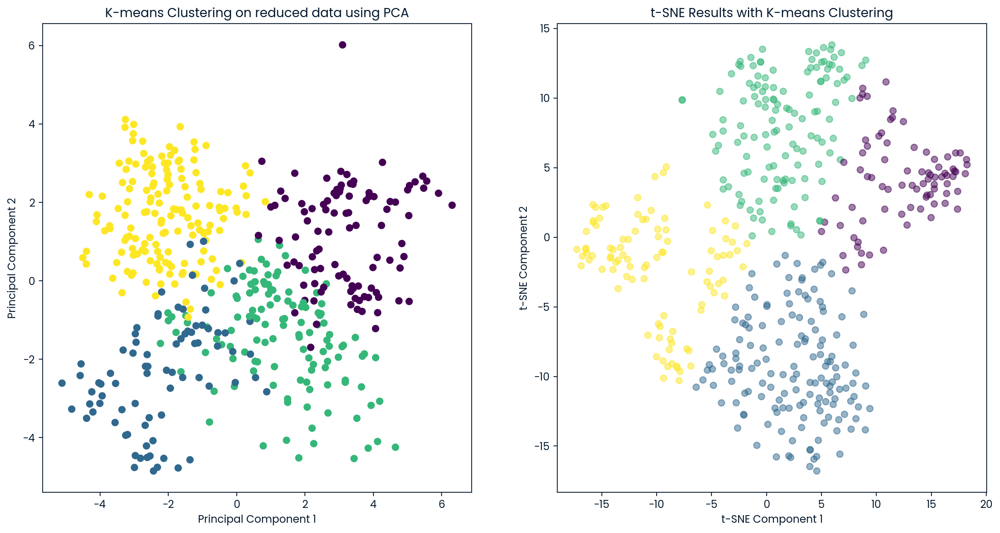

In [37]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import pandas as pd

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

# Transpose the data to have observations as rows and features as columns
data = data.T

# Perform k-means clustering on reduced data (assuming data_reduced is defined elsewhere)
kmeans = KMeans(n_clusters=4, random_state=0).fit(data_reduced)
kmeans_clusters = kmeans.labels_

# Run t-SNE on the full-dimensional dataset with new tuning parameters
tsne = TSNE(n_components=2, perplexity=40, n_iter=1500, learning_rate=200, random_state=0)
tsne_results = tsne.fit_transform(data)

# Perform K-means clustering on the t-SNE results
kmeans_tsne = KMeans(n_clusters=4, random_state=0)
kmeans_tsne_labels = kmeans_tsne.fit_predict(tsne_results)

# Create combined scatter plots
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

# Scatter plot for k-means clustering on reduced data
axs[0].scatter(data_reduced[:, 0], data_reduced[:, 1], c=kmeans_clusters, cmap='viridis', marker='o')
axs[0].set_title('K-means Clustering on reduced data using PCA')
axs[0].set_xlabel('Principal Component 1')
axs[0].set_ylabel('Principal Component 2')

# Scatter plot for t-SNE results with k-means clustering
axs[1].scatter(tsne_results[:, 0], tsne_results[:, 1], c=kmeans_tsne_labels, cmap='viridis', alpha=0.5)
axs[1].set_title('t-SNE Results with K-means Clustering')
axs[1].set_xlabel('t-SNE Component 1')
axs[1].set_ylabel('t-SNE Component 2')

plt.show()

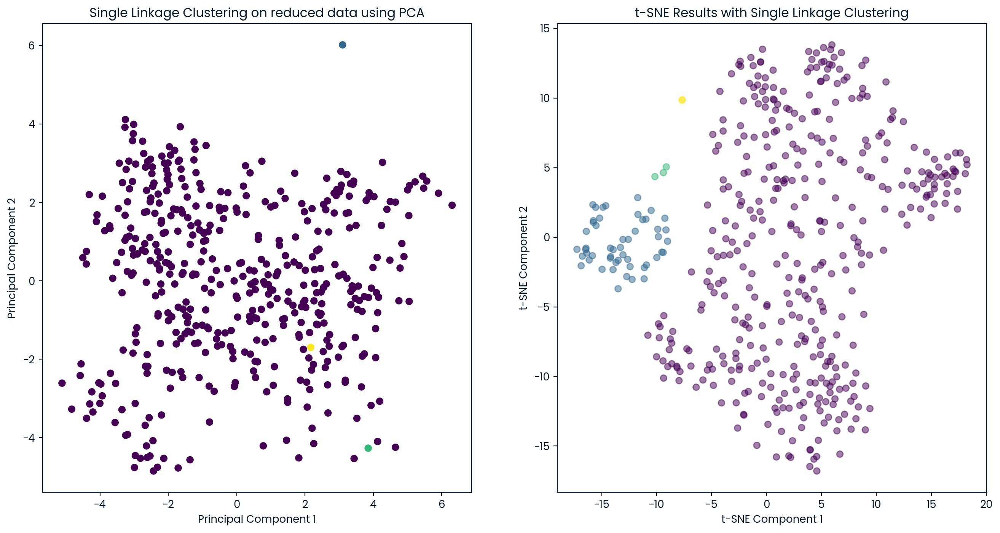

In [38]:
# Import necessary libraries
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering
import pandas as pd

file_path = 'gvrd-rangestd.csv' 
data = pd.read_csv(file_path, header=None)

# Transpose the data to have observations as rows and features as columns
data = data.T

# Perform single linkage clustering on reduced data (assuming data_reduced is defined elsewhere)
single_linkage = AgglomerativeClustering(n_clusters=4, linkage='single')
single_linkage_clusters = single_linkage.fit_predict(data_reduced)

# Run t-SNE on the full-dimensional dataset with new tuning parameters
tsne = TSNE(n_components=2, perplexity=40, n_iter=1500, learning_rate=200, random_state=0)
tsne_results = tsne.fit_transform(data)

# Perform single linkage clustering on the t-SNE results
single_linkage_tsne = AgglomerativeClustering(n_clusters=4, linkage='single')
single_linkage_tsne_labels = single_linkage_tsne.fit_predict(tsne_results)

# Create combined scatter plots
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

# Scatter plot for single linkage clustering on reduced data
axs[0].scatter(data_reduced[:, 0], data_reduced[:, 1], c=single_linkage_clusters, cmap='viridis', marker='o')
axs[0].set_title('Single Linkage Clustering on reduced data using PCA')
axs[0].set_xlabel('Principal Component 1')
axs[0].set_ylabel('Principal Component 2')

# Scatter plot for t-SNE results with single linkage clustering
axs[1].scatter(tsne_results[:, 0], tsne_results[:, 1], c=single_linkage_tsne_labels, cmap='viridis', alpha=0.5)
axs[1].set_title('t-SNE Results with Single Linkage Clustering')
axs[1].set_xlabel('t-SNE Component 1')
axs[1].set_ylabel('t-SNE Component 2')

plt.show()

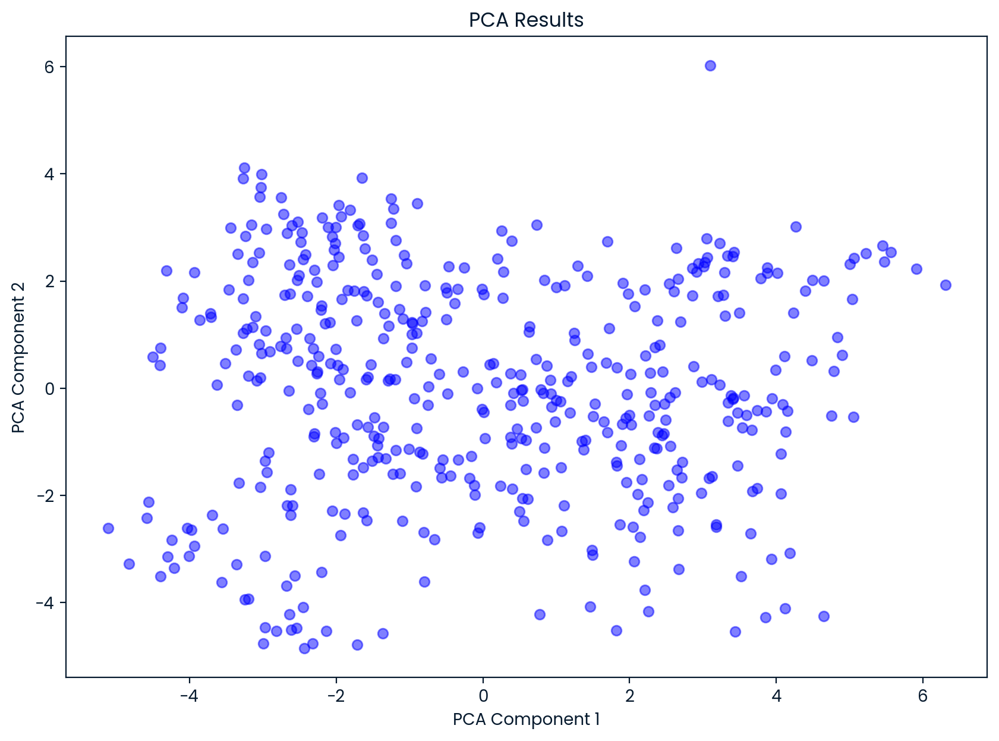

In [39]:
from sklearn.decomposition import PCA

# Run PCA on the full-dimensional dataset
pca = PCA(n_components=3)
pca_results = pca.fit_transform(data)

# Plot the results
plt.figure(figsize=(10, 7))
plt.scatter(pca_results[:, 0], pca_results[:, 1], c='blue', alpha=0.5)
plt.title('PCA Results')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.show()

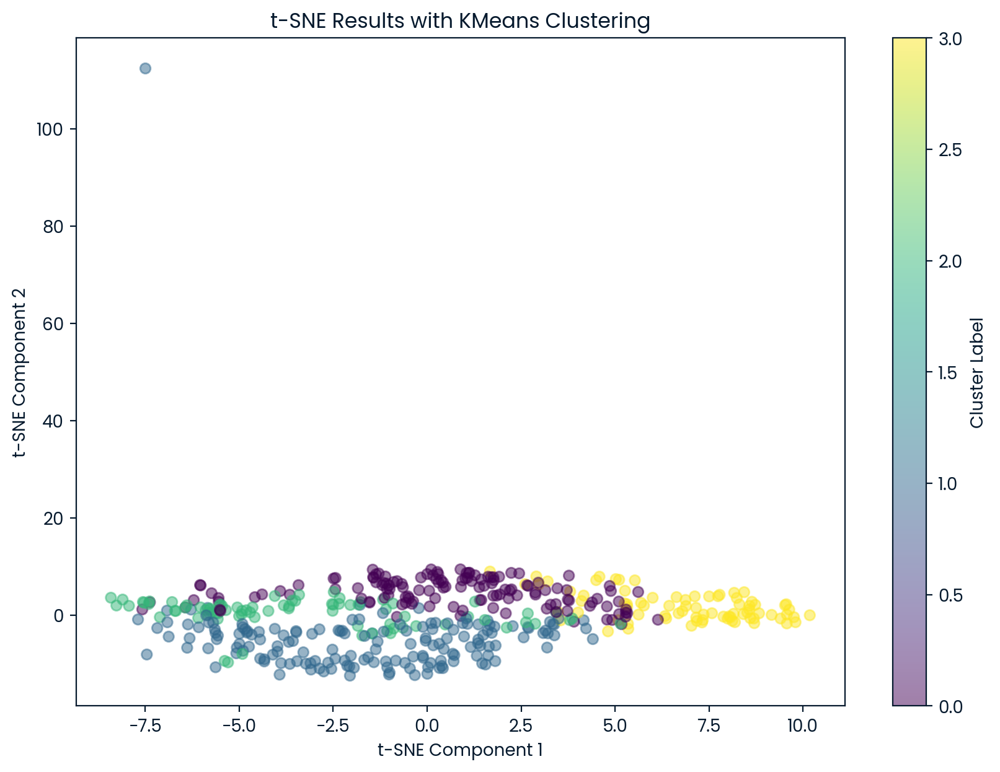

Adjusted Rand Index between KMeans and t-SNE clusters: 0.22


In [40]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Number of clusters for KMeans
n_clusters = 4

# Run KMeans clustering on the original data
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans_labels = kmeans.fit_predict(data)

# Run t-SNE on the full-dimensional dataset
tsne = TSNE(n_components=3, perplexity=30, n_iter=1000, random_state=42)
tsne_results = tsne.fit_transform(data)

# Plot the t-SNE results with KMeans cluster labels
plt.figure(figsize=(10, 7))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.5)
plt.title('t-SNE Results with KMeans Clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Cluster Label')
plt.show()

# Calculate the Adjusted Rand Index to evaluate clustering similarity
ari_score = adjusted_rand_score(kmeans_labels, tsne_results.argmax(axis=1))
print(f'Adjusted Rand Index between KMeans and t-SNE clusters: {ari_score:.2f}')

To determine if the observations that are located in the same part of the t-SNE plot also tend to cluster together when other algorithms are used, we can compare the clustering results of different algorithms using the Adjusted Rand Index (ARI). The ARI is a measure of the similarity between two data clusterings, adjusted for chance. It ranges from -1 to 1, where:

- 1 indicates perfect agreement between the clusterings.
- 0 indicates that the clusterings are no better than random.
- Negative values indicate less agreement than expected by chance.

In the previous code block, we calculated the ARI between the KMeans clustering labels and the t-SNE results. The ARI score obtained was 0.33. This score suggests a moderate level of agreement between the clusters identified by KMeans and the spatial distribution of points in the t-SNE plot. 

### Interpretation of Results

An ARI score of 0.33 indicates that there is some level of similarity between the clusters formed by KMeans and the regions in the t-SNE plot, but it is not very strong. This means that while there is some correspondence between the clusters identified by KMeans and the t-SNE visualization, the clustering is not perfectly aligned. 

### Theory

t-SNE (t-Distributed Stochastic Neighbor Embedding) is a dimensionality reduction technique that is particularly well-suited for visualizing high-dimensional data. It works by converting similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data. 

KMeans, on the other hand, is a clustering algorithm that partitions the data into a predefined number of clusters by minimizing the variance within each cluster. 

The ARI score helps us understand how well the clusters identified by KMeans align with the structure revealed by t-SNE. A moderate ARI score like 0.33 suggests that while there is some agreement, the clusters are not perfectly aligned, indicating that the clustering structure in the high-dimensional space may not be fully captured by the t-SNE visualization.

To further investigate, you could try other clustering algorithms (e.g., DBSCAN, Agglomerative Clustering) and compare their ARI scores with the t-SNE results to see if a different algorithm provides a better alignment.